In [1]:
import pandas as pd
import os
import re
from datetime import datetime

def parse_log_to_dataframe(log_file_path):
    """
    Converte um arquivo de log em um DataFrame com as métricas de configuração e resultados.
    """
    experiment_config = {}
    batch_results = []
    save_model_result = {}
    inference_result = {}
    current_section = None
    epoch = 0
    config_pattern = r"(\w+\s*\w*)\s*:\s*(.+)"
    # Atualizado para capturar números inteiros ou decimais, incluindo números grandes
    result_pattern = r"(\w+\s*\w*\s*\w*\s*\w*)\s*:\s*([-]?\d*\.?\d+)"
    
    try:
        with open(log_file_path, 'r') as file:
            lines = file.readlines()
            total_lines = len(lines)
            
            for i, line in enumerate(lines):
                line = line.strip()
                if "EXPERIMENT CONFIGURATION" in line:
                    current_section = "config"
                    continue
                elif "Época" in line and "concluída" in line:
                    epoch += 1
                    continue
                elif "EXPERIMENT RESULTS" in line:
                    # Determinar se é treinamento, salvar modelo ou inferência
                    if i + 1 < total_lines and "Modelo salvo em" in lines[i + 1]:
                        current_section = "save_model"
                    elif i + 1 < total_lines and "Iniciando pipeline de inferência para avaliação final" in lines[i + 1]:
                        current_section = "inference"
                    else:
                        current_section = "batch"
                        batch_results.append({})
                    continue
                if current_section == "config":
                    match = re.match(config_pattern, line.split(" - INFO - ")[-1])
                    if match:
                        key, value = match.groups()
                        experiment_config[key.strip()] = value.strip()
                if current_section in ["batch", "save_model", "inference"]:
                    match = re.match(result_pattern, line.split(" - INFO - ")[-1])
                    if match:
                        key, value = match.groups()
                        key = key.strip()
                        try:
                            value = float(value)
                        except ValueError:
                            print(f"Aviso: Não foi possível converter '{value}' para float em {key} ({log_file_path})")
                            continue
                        if current_section == "batch":
                            batch_results[-1][key] = value
                            batch_results[-1]["Epoch"] = epoch
                        elif current_section == "save_model":
                            save_model_result[key] = value
                        elif current_section == "inference":
                            inference_result[key] = value
    
        batch_df = pd.DataFrame(batch_results)
        batch_df["Phase"] = "Training"
        save_model_df = pd.DataFrame([save_model_result])
        save_model_df["Phase"] = "Save Model"
        save_model_df["Epoch"] = None
        inference_df = pd.DataFrame([inference_result])
        inference_df["Phase"] = "Inference"
        inference_df["Epoch"] = None
        df = pd.concat([batch_df, save_model_df, inference_df], ignore_index=True)
        for key, value in experiment_config.items():
            df[key] = value
        columns = [
            "Phase", "Epoch", "Elapsed Time Seconds", "Cpu Usage Percent",
            "Ram Peak Usage Bytes", "Vram Peak Usage Bytes", "Gpu Power Watts",
            "Gpu Temp Celsius", "Gpu Utilization Percent", "Disk Read Bytes",
            "Disk Write Bytes", "Accuracy", "Precision", "Recall", "F1 Score",
            "Model Name", "Config File", "Train Data", "Validation Data",
            "model_params", "train_params", "inference_params"
        ]
        for col in columns:
            if col not in df.columns:
                df[col] = None
        df = df[columns]
        return df
    
    except Exception as e:
        print(f"Erro ao processar {log_file_path}: {str(e)}")
        return None
def fix_csv_phase_lines(csv_path):
    """
    Corrige o CSV ajustando as linhas de 'Save Model' e 'Inference' e removendo linhas extras vazias.
    - Sobrescreve o Phase da linha n-4 com 'Save Model' e da linha n-3 com 'Inference'.
    - Remove as linhas n-2 e n-1 (vazias).
    """
    try:
        df = pd.read_csv(csv_path)
        if len(df) < 4:
            print(f"Aviso: CSV {csv_path} tem menos de 4 linhas, não é possível corrigir.")
            return df
        
        # Identificar as últimas 4 linhas
        n = len(df)
        if df.iloc[n-2]["Phase"] == "Save Model" and df.iloc[n-1]["Phase"] == "Inference":
            # Verificar se n-2 e n-1 estão vazias (exceto Phase e colunas de configuração)
            metric_columns = [
                "Elapsed Time Seconds", "Cpu Usage Percent", "Ram Peak Usage Bytes",
                "Vram Peak Usage Bytes", "Gpu Power Watts", "Gpu Temp Celsius",
                "Gpu Utilization Percent", "Disk Read Bytes", "Disk Write Bytes",
                "Accuracy", "Precision", "Recall", "F1 Score"
            ]
            if (df.iloc[n-2][metric_columns].isna().all() and 
                df.iloc[n-1][metric_columns].isna().all()):
                # Sobrescrever Phase de n-4 e n-3
                df.at[n-4, "Phase"] = "Save Model"
                df.at[n-3, "Phase"] = "Inference"
                # Remover linhas n-2 e n-1
                df = df.drop([n-2, n-1]).reset_index(drop=True)
                # Salvar o CSV corrigido
                df.to_csv(csv_path, index=False)
                print(f"CSV {csv_path} corrigido: linhas extras removidas e Phase ajustado.")
        return df
    except Exception as e:
        print(f"Erro ao corrigir CSV {csv_path}: {str(e)}")
        return None

def fix_epoch_column(csv_path):
    """
    Corrige a coluna Epoch no CSV, atribuindo valores de 1 a N para linhas com Phase='Training',
    mantendo Epoch=None para Save Model e Inference.
    """
    try:
        df = pd.read_csv(csv_path)
        if len(df) == 0:
            print(f"Aviso: CSV {csv_path} está vazio, não é possível corrigir Epoch.")
            return df
        
        # Identificar linhas com Phase="Training"
        training_mask = df["Phase"] == "Training"
        num_training_rows = training_mask.sum()
        
        # Atribuir valores de 1 a N para Epoch nas linhas de treinamento
        if num_training_rows > 0:
            df.loc[training_mask, "Epoch"] = range(1, num_training_rows + 1)
        
        # Garantir que Epoch seja None para Save Model e Inference
        df.loc[df["Phase"].isin(["Save Model", "Inference"]), "Epoch"] = None
        
        # Salvar o CSV corrigido
        df.to_csv(csv_path, index=False)
        print(f"CSV {csv_path} corrigido: coluna Epoch ajustada.")
        return df
    except Exception as e:
        print(f"Erro ao corrigir Epoch em {csv_path}: {str(e)}")
        return None

def save_log_to_csv(log_file_path, output_base_dir="logs_csv"):
    file_name = os.path.splitext(os.path.basename(log_file_path))[0]
    os.makedirs(output_base_dir, exist_ok=True)
    df = parse_log_to_dataframe(log_file_path)
    
    if df is not None:
        csv_file_path = os.path.join(output_base_dir, f"{file_name}.csv")
        df.to_csv(csv_file_path, index=False)
        print(f"CSV salvo em: {csv_file_path}")
        # Corrigir as linhas de Phase
        df_corrected = fix_csv_phase_lines(csv_file_path)
        if df_corrected is not None:
            # Corrigir a coluna Epoch
            df_corrected = fix_epoch_column(csv_file_path)
            if df_corrected is not None:
                return df_corrected, csv_file_path
        print(f"Falha ao corrigir CSV para {log_file_path}")
        return None, None
    else:
        print(f"Falha ao gerar CSV para {log_file_path}")
        return None, None

def process_all_logs(logs_dir="logs", output_base_dir="logs_csv"):
    if not os.path.exists(logs_dir):
        print(f"Diretório {logs_dir} não encontrado.")
        return []
    
    log_files = [f for f in os.listdir(logs_dir) if f.endswith(".log")]
    if not log_files:
        print(f"Nenhum arquivo .log encontrado em {logs_dir}.")
        return []
    
    csv_paths = []
    all_dfs = []
    
    for log_file in log_files:
        log_file_path = os.path.join(logs_dir, log_file)
        print(f"Processando {log_file_path}...")
        df, csv_path = save_log_to_csv(log_file_path, output_base_dir)
        if df is not None and csv_path:
            df["log_file"] = os.path.splitext(log_file)[0]
            all_dfs.append(df)
            csv_paths.append(csv_path)
    
    if all_dfs:
        combined_df = pd.concat(all_dfs, ignore_index=True)
        columns = ["log_file"] + [col for col in combined_df.columns if col != "log_file"]
        combined_df = combined_df[columns]
        combined_csv_path = os.path.join(output_base_dir, "combined_logs.csv")
        combined_df.to_csv(combined_csv_path, index=False)
        # Corrigir o CSV consolidado
        combined_df = fix_csv_phase_lines(combined_csv_path)
        if combined_df is not None:
            combined_df = fix_epoch_column(combined_csv_path)
        print(f"CSV consolidado salvo em: {combined_csv_path}")
        csv_paths.append(combined_csv_path)
    
    print(f"Processamento concluído. {len(csv_paths)} arquivos CSV gerados.")
    return csv_paths

In [2]:
csv_paths = process_all_logs(logs_dir="logs")

Processando logs\efficientnet_b0_epochs_100_bs_384_20251101_201648.log...
CSV salvo em: logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_201648.csv
CSV logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_201648.csv corrigido: linhas extras removidas e Phase ajustado.
CSV logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_201648.csv corrigido: coluna Epoch ajustada.
Processando logs\efficientnet_b0_epochs_100_bs_384_20251101_205133.log...
CSV salvo em: logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_205133.csv
CSV logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_205133.csv corrigido: linhas extras removidas e Phase ajustado.
CSV logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_205133.csv corrigido: coluna Epoch ajustada.
Processando logs\efficientnet_b0_epochs_100_bs_384_20251101_211222.log...
CSV salvo em: logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_211222.csv
CSV logs_csv\efficientnet_b0_epochs_100_bs_384_20251101_211222.csv corrigido: linhas extras removidas e P

In [3]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import numpy as np

def extract_model_name(filename):
    """
    Extrai o nome do modelo do nome do arquivo até '_bs_64_'.
    Exemplo: 'mobilenet_V1_epochs_10_bs_64_20251003_185248.csv' -> 'mobilenet_V1'
    """
    return filename.split('_bs_')[0]

def calculate_training_time_per_csv(csv_path):
    """
    Calcula o tempo total de treinamento (soma de Elapsed Time Seconds para Phase='Training')
    para um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        # Filtrar linhas com Phase='Training' e somar Elapsed Time Seconds
        training_time = df[df['Phase'] == 'Training']['Elapsed Time Seconds'].sum()
        return training_time
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def calculate_save_model_time_per_csv(csv_path):
    """
    Extrai o tempo de salvamento do modelo (Elapsed Time Seconds para Phase='Save Model')
    para um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        # Filtrar a linha com Phase='Save Model'
        save_model_row = df[df['Phase'] == 'Save Model']
        if not save_model_row.empty:
            save_model_time = save_model_row['Elapsed Time Seconds'].iloc[0]
            return save_model_time
        else:
            print(f"Aviso: Nenhuma linha com Phase='Save Model' encontrada em {csv_path}")
            return None
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def plot_training_time_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando o tempo médio de treinamento por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_times = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        training_time = calculate_training_time_per_csv(csv_path)
        
        if training_time is not None:
            if model_name not in model_times:
                model_times[model_name] = []
            model_times[model_name].append(training_time)
    
    model_names = []
    mean_times = []
    std_times = []
    for model_name, times in model_times.items():
        model_names.append(model_name)
        mean_times.append(np.mean(times))
        std_times.append(np.std(times) if len(times) > 1 else 0)
    
    sorted_indices = np.argsort(mean_times)
    model_names = [model_names[i] for i in sorted_indices]
    mean_times = [mean_times[i] for i in sorted_indices]
    std_times = [std_times[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_times, yerr=std_times, capsize=5, color='skyblue', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average Training Time (seconds)')
    plt.title('Comparison of Average Training Time by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 10, f'{yval:.1f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/training_time_comparison.png')
    plt.show()


def plot_save_model_time_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando o tempo médio de salvamento do modelo por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_times = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        save_model_time = calculate_save_model_time_per_csv(csv_path)
        
        if save_model_time is not None:
            if model_name not in model_times:
                model_times[model_name] = []
            model_times[model_name].append(save_model_time)
    
    model_names = []
    mean_times = []
    std_times = []
    for model_name, times in model_times.items():
        model_names.append(model_name)
        mean_times.append(np.mean(times))
        std_times.append(np.std(times) if len(times) > 1 else 0)
    
    sorted_indices = np.argsort(mean_times)
    model_names = [model_names[i] for i in sorted_indices]
    mean_times = [mean_times[i] for i in sorted_indices]
    std_times = [std_times[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_times, yerr=std_times, capsize=5, color='lightgreen', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average Saving Time (seconds)')
    plt.title('Comparação do Tempo Médio de Salvamento do Modelo por Modelo')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 1100, f'{yval:.1f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/saving_time_comparison.png')
    plt.show()

def calculate_inference_time_per_csv(csv_path):
    """
    Extrai o tempo de inferência (Elapsed Time Seconds para Phase='Inference')
    para um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        # Filtrar a linha com Phase='Inference'
        inference_row = df[df['Phase'] == 'Inference']
        if not inference_row.empty:
            inference_time = inference_row['Elapsed Time Seconds'].iloc[0]
            return inference_time
        else:
            print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
            return None
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def plot_inference_time_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando o tempo médio de inferência por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_times = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        inference_time = calculate_inference_time_per_csv(csv_path)
        
        if inference_time is not None:
            if model_name not in model_times:
                model_times[model_name] = []
            model_times[model_name].append(inference_time)
    
    model_names = []
    mean_times = []
    std_times = []
    for model_name, times in model_times.items():
        model_names.append(model_name)
        mean_times.append(np.mean(times))
        std_times.append(np.std(times) if len(times) > 1 else 0)
    
    sorted_indices = np.argsort(mean_times)
    model_names = [model_names[i] for i in sorted_indices]
    mean_times = [mean_times[i] for i in sorted_indices]
    std_times = [std_times[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_times, yerr=std_times, capsize=5, color='salmon', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average Inference Time (segundos)')
    plt.title('Comparison of Average Inference Time by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 1, f'{yval:.1f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/inference_time_comparison.png')
    plt.show()

def calculate_avg_power_per_csv(csv_path):
    """
    Calcula a média de Gpu Power Watts para todas as Phases em um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        avg_power = df['Gpu Power Watts'].mean()
        return avg_power
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def calculate_avg_temp_per_csv(csv_path):
    """
    Calcula a média de Gpu Temp Celsius para todas as Phases em um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        avg_temp = df['Gpu Temp Celsius'].mean()
        return avg_temp
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def plot_power_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando a média das médias de Gpu Power Watts
    em todas as Phases por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_power = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        avg_power = calculate_avg_power_per_csv(csv_path)
        
        if avg_power is not None:
            if model_name not in model_power:
                model_power[model_name] = []
            model_power[model_name].append(avg_power)
    
    model_names = []
    mean_powers = []
    std_powers = []
    for model_name, powers in model_power.items():
        model_names.append(model_name)
        mean_powers.append(np.mean(powers))
        std_powers.append(np.std(powers) if len(powers) > 1 else 0)
    
    sorted_indices = np.argsort(mean_powers)
    model_names = [model_names[i] for i in sorted_indices]
    mean_powers = [mean_powers[i] for i in sorted_indices]
    std_powers = [std_powers[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_powers, yerr=std_powers, capsize=5, color='lightcoral', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average Energy Consumption (Watts)')
    plt.title('Comparison of Average Energy Consumption by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 20, f'{yval:.1f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/power_comparison.png')
    plt.show()

def plot_temp_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando a média das médias de Gpu Temp Celsius
    em todas as Phases por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_temp = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        avg_temp = calculate_avg_temp_per_csv(csv_path)
        
        if avg_temp is not None:
            if model_name not in model_temp:
                model_temp[model_name] = []
            model_temp[model_name].append(avg_temp)
    
    model_names = []
    mean_temps = []
    std_temps = []
    for model_name, temps in model_temp.items():
        model_names.append(model_name)
        mean_temps.append(np.mean(temps))
        std_temps.append(np.std(temps) if len(temps) > 1 else 0)
    
    sorted_indices = np.argsort(mean_temps)
    model_names = [model_names[i] for i in sorted_indices]
    mean_temps = [mean_temps[i] for i in sorted_indices]
    std_temps = [std_temps[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_temps, yerr=std_temps, capsize=5, color='lightblue', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average GPU temperature (Celsius)')
    plt.title('Comparison of Average GPU Temperature by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 2, f'{yval:.1f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/temp_comparison.png')
    plt.show()
    
def calculate_avg_gpu_utilization_per_csv(csv_path):
    """
    Calcula a média de Gpu Utilization Percent para todas as Phases em um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        avg_gpu_util = df['Gpu Utilization Percent'].mean()
        return avg_gpu_util
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def calculate_inference_accuracy_per_csv(csv_path):
    """
    Extrai o valor de Accuracy para Phase='Inference' em um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        inference_row = df[df['Phase'] == 'Inference']
        if not inference_row.empty:
            accuracy = inference_row['Accuracy'].iloc[0]
            return accuracy
        else:
            print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
            return None
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def calculate_inference_f1_score_per_csv(csv_path):
    """
    Extrai o valor de F1 Score para Phase='Inference' em um único CSV.
    """
    try:
        df = pd.read_csv(csv_path)
        inference_row = df[df['Phase'] == 'Inference']
        if not inference_row.empty:
            f1_score = inference_row['F1 Score'].iloc[0]
            return f1_score
        else:
            print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
            return None
    except Exception as e:
        print(f"Erro ao processar {csv_path}: {str(e)}")
        return None

def plot_gpu_utilization_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando a média das médias de Gpu Utilization Percent
    em todas as Phases por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_gpu_util = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        avg_gpu_util = calculate_avg_gpu_utilization_per_csv(csv_path)
        
        if avg_gpu_util is not None:
            if model_name not in model_gpu_util:
                model_gpu_util[model_name] = []
            model_gpu_util[model_name].append(avg_gpu_util)
    
    model_names = []
    mean_gpu_utils = []
    std_gpu_utils = []
    for model_name, gpu_utils in model_gpu_util.items():
        model_names.append(model_name)
        mean_gpu_utils.append(np.mean(gpu_utils))
        std_gpu_utils.append(np.std(gpu_utils) if len(gpu_utils) > 1 else 0)
    
    sorted_indices = np.argsort(mean_gpu_utils)
    model_names = [model_names[i] for i in sorted_indices]
    mean_gpu_utils = [mean_gpu_utils[i] for i in sorted_indices]
    std_gpu_utils = [std_gpu_utils[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_gpu_utils, yerr=std_gpu_utils, capsize=5, color='purple', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average GPU Usage (%)')
    plt.title('Comparison of Average GPU Usage by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 2, f'{yval:.1f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/gpu_utilization_comparison.png')
    plt.show()

def plot_inference_accuracy_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando a média de Accuracy na inferência por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_accuracy = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        accuracy = calculate_inference_accuracy_per_csv(csv_path)
        
        if accuracy is not None:
            if model_name not in model_accuracy:
                model_accuracy[model_name] = []
            model_accuracy[model_name].append(accuracy)
    
    model_names = []
    mean_accuracies = []
    std_accuracies = []
    for model_name, accuracies in model_accuracy.items():
        model_names.append(model_name)
        mean_accuracies.append(np.mean(accuracies))
        std_accuracies.append(np.std(accuracies) if len(accuracies) > 1 else 0)
    
    sorted_indices = np.argsort(mean_accuracies)
    model_names = [model_names[i] for i in sorted_indices]
    mean_accuracies = [mean_accuracies[i] for i in sorted_indices]
    std_accuracies = [std_accuracies[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_accuracies, yerr=std_accuracies, capsize=5, color='lightpink', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average Accuracy on Inference')
    plt.title('Comparison of Average Accuracy on Inference by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 0.0005, f'{yval:.4f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/inference_accuracy_comparison.png')
    plt.show()

def plot_inference_f1_score_comparison(csv_dir="logs_csv"):
    """
    Gera um gráfico de barras comparando a média de F1 Score na inferência por modelo.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_f1_score = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        f1_score = calculate_inference_f1_score_per_csv(csv_path)
        
        if f1_score is not None:
            if model_name not in model_f1_score:
                model_f1_score[model_name] = []
            model_f1_score[model_name].append(f1_score)
    
    model_names = []
    mean_f1_scores = []
    std_f1_scores = []
    for model_name, f1_scores in model_f1_score.items():
        model_names.append(model_name)
        mean_f1_scores.append(np.mean(f1_scores))
        std_f1_scores.append(np.std(f1_scores) if len(f1_scores) > 1 else 0)
    
    sorted_indices = np.argsort(mean_f1_scores)
    model_names = [model_names[i] for i in sorted_indices]
    mean_f1_scores = [mean_f1_scores[i] for i in sorted_indices]
    std_f1_scores = [std_f1_scores[i] for i in sorted_indices]
    
    plt.figure(figsize=(10, 6))
    bars = plt.bar(model_names, mean_f1_scores, yerr=std_f1_scores, capsize=5, color='lightyellow', edgecolor='black')
    plt.xlabel('Model')
    plt.ylabel('Average F1 Score')
    plt.title('Comparison of Average F1 Score by Model')
    plt.xticks(rotation=45, ha='right')
    plt.grid(True, axis='y', linestyle='--', alpha=0.7)
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width()/2, 0.001, f'{yval:.4f}', ha='center', va='bottom')
    plt.tight_layout()
    plt.savefig('results/f1_score_comparison.png')
    plt.show()

def plot_training_time_vs_inference_accuracy(csv_dir="logs_csv"):
    """
    Gera um scatter plot com o tempo total de treinamento (eixo X) vs. acurácia na inferência (eixo Y)
    para cada CSV, com cores únicas por modelo usando a paleta tab20.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Calcular tempo total de treinamento (soma de Elapsed Time Seconds para Phase='Training')
            training_time = df[df['Phase'] == 'Training']['Elapsed Time Seconds'].sum()
            # Extrair acurácia na inferência (Accuracy para Phase='Inference')
            inference_row = df[df['Phase'] == 'Inference']
            if not inference_row.empty:
                accuracy = inference_row['Accuracy'].iloc[0]
            else:
                print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
                continue
            
            if model_name not in model_data:
                model_data[model_name] = {'training_times': [], 'accuracies': []}
            model_data[model_name]['training_times'].append(training_time)
            model_data[model_name]['accuracies'].append(accuracy)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['training_times'],
            model_data[model_name]['accuracies'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Total Training Time (seconds)')
    plt.ylabel('Inference Accuracy')
    plt.title('Training Time vs. Inference Accuracy')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig('results/training_time_vs_inference_Acc.png')
    plt.show()

def plot_training_time_vs_inference_f1_score(csv_dir="logs_csv"):
    """
    Gera um scatter plot com o tempo total de treinamento (eixo X) vs. F1 Score na inferência (eixo Y)
    para cada CSV, com cores únicas por modelo usando a paleta tab20.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Calcular tempo total de treinamento (soma de Elapsed Time Seconds para Phase='Training')
            training_time = df[df['Phase'] == 'Training']['Elapsed Time Seconds'].sum()
            # Extrair F1 Score na inferência (F1 Score para Phase='Inference')
            inference_row = df[df['Phase'] == 'Inference']
            if not inference_row.empty:
                f1_score = inference_row['F1 Score'].iloc[0]
            else:
                print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
                continue
            
            if model_name not in model_data:
                model_data[model_name] = {'training_times': [], 'f1_scores': []}
            model_data[model_name]['training_times'].append(training_time)
            model_data[model_name]['f1_scores'].append(f1_score)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['training_times'],
            model_data[model_name]['f1_scores'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Total Training Time (seconds)')
    plt.ylabel('F1 Score on Inference')
    plt.title('Training Time vs. F1 Score on Inference by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig('results/training_time_vs_f1_score.png')
    plt.show()

def plot_epoch_training_time_vs_gpu_power(csv_dir="logs_csv"):
    """
    Gera um scatter plot com o tempo de treinamento por época (eixo X) vs. Gpu Power Watts (eixo Y)
    para cada época em cada CSV, com cores únicas por modelo usando a paleta tab20.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Filtrar linhas com Phase='Training'
            training_rows = df[df['Phase'] == 'Training']
            if training_rows.empty:
                print(f"Aviso: Nenhuma linha com Phase='Training' encontrada em {csv_path}")
                continue
            
            # Extrair tempo de treinamento e Gpu Power Watts por época
            training_times = training_rows['Elapsed Time Seconds'].tolist()
            gpu_powers = training_rows['Gpu Power Watts'].tolist()
            
            if model_name not in model_data:
                model_data[model_name] = {'training_times': [], 'gpu_powers': []}
            model_data[model_name]['training_times'].extend(training_times)
            model_data[model_name]['gpu_powers'].extend(gpu_powers)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['training_times'],
            model_data[model_name]['gpu_powers'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Training Time per Epoch (seconds)')
    plt.ylabel('Gpu Power (Watts)')
    plt.title('Training Time per Epoch vs. Gpu Power by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig('results/epoch_training_time_vs_gpu_power.png')
    plt.show()


def plot_epoch_training_time_vs_gpu_temp(csv_dir="logs_csv"):
    """
    Gera um scatter plot com o tempo de treinamento por época (eixo X) vs. Gpu Temp Celsius (eixo Y)
    para cada época em cada CSV, com cores únicas por modelo usando a paleta tab20.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Filtrar linhas com Phase='Training'
            training_rows = df[df['Phase'] == 'Training']
            if training_rows.empty:
                print(f"Aviso: Nenhuma linha com Phase='Training' encontrada em {csv_path}")
                continue
            
            # Extrair tempo de treinamento e Gpu Temp Celsius por época
            training_times = training_rows['Elapsed Time Seconds'].tolist()
            gpu_temps = training_rows['Gpu Temp Celsius'].tolist()
            
            if model_name not in model_data:
                model_data[model_name] = {'training_times': [], 'gpu_temps': []}
            model_data[model_name]['training_times'].extend(training_times)
            model_data[model_name]['gpu_temps'].extend(gpu_temps)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['training_times'],
            model_data[model_name]['gpu_temps'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Training Time per Epoch (seconds)')
    plt.ylabel('GPU Temperature (Celsius)')
    plt.title('Training Time per Epoch vs. GPU Temperature by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.savefig('results/epoch_training_time_vs_gpu_temp.png')
    plt.show()

def plot_max_vram_vs_inference_f1_score(csv_dir="logs_csv"):
    """
    Gera um scatter plot com o maior valor de Vram Peak Usage Bytes (eixo X) vs. F1 Score na inferência (eixo Y)
    para cada CSV, com cores únicas por modelo usando a paleta tab20.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Obter o maior valor de Vram Peak Usage Bytes no CSV
            max_vram = df['Vram Peak Usage Bytes'].max()
            # Extrair F1 Score na inferência (F1 Score para Phase='Inference')
            inference_row = df[df['Phase'] == 'Inference']
            if not inference_row.empty:
                f1_score = inference_row['F1 Score'].iloc[0]
            else:
                print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
                continue
            
            if model_name not in model_data:
                model_data[model_name] = {'max_vrams': [], 'f1_scores': []}
            model_data[model_name]['max_vrams'].append(max_vram)
            model_data[model_name]['f1_scores'].append(f1_score)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['max_vrams'],
            model_data[model_name]['f1_scores'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Vram Peak Usage (bytes)')
    plt.ylabel('F1 Score on Inference')
    plt.title('VRAM Peak Usage vs. F1 Score on Inference by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    max_vram_all = max([max(data['max_vrams']) for data in model_data.values()]) if model_data else 1
    plt.xlim(left=0, right=max_vram_all * 1.1) 
    plt.tight_layout()
    plt.tight_layout()
    plt.savefig('results/peak_vram_vs_f1_score.png')
    plt.show()

def plot_max_vram_vs_inference_accuracy(csv_dir="logs_csv"):
    """
    Gera um scatter plot com o maior valor de Vram Peak Usage Bytes (eixo X) vs. Accuracy na inferência (eixo Y)
    para cada CSV, com cores únicas por modelo usando a paleta tab20.
    """
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Obter o maior valor de Vram Peak Usage Bytes no CSV
            max_vram = df['Vram Peak Usage Bytes'].max()
            # Extrair Accuracy na inferência (Accuracy para Phase='Inference')
            inference_row = df[df['Phase'] == 'Inference']
            if not inference_row.empty:
                accuracy = inference_row['Accuracy'].iloc[0]
            else:
                print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
                continue
            
            if model_name not in model_data:
                model_data[model_name] = {'max_vrams': [], 'accuracies': []}
            model_data[model_name]['max_vrams'].append(max_vram)
            model_data[model_name]['accuracies'].append(accuracy)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['max_vrams'],
            model_data[model_name]['accuracies'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Vram Peak Usage (bytes)')
    plt.ylabel('Inference Accuracy')
    plt.title('VRAM Peak Usage vs. Inference Accuracy by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    max_vram_all = max([max(data['max_vrams']) for data in model_data.values()]) if model_data else 1
    plt.xlim(left=0, right=max_vram_all * 1.1) 
    plt.tight_layout()
    plt.savefig('results/peak_vram_vs_inference_acc.png')
    plt.show()
   


def plot_max_ram_vs_inference_f1_score(csv_dir="logs_csv"):

    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Obter o maior valor de Vram Peak Usage Bytes no CSV
            max_vram = df['Ram Peak Usage Bytes'].max()
            # Extrair F1 Score na inferência (F1 Score para Phase='Inference')
            inference_row = df[df['Phase'] == 'Inference']
            if not inference_row.empty:
                f1_score = inference_row['F1 Score'].iloc[0]
            else:
                print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
                continue
            
            if model_name not in model_data:
                model_data[model_name] = {'max_rams': [], 'f1_scores': []}
            model_data[model_name]['max_rams'].append(max_vram)
            model_data[model_name]['f1_scores'].append(f1_score)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['max_rams'],
            model_data[model_name]['f1_scores'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Ram Peak Usage (bytes)')
    plt.ylabel('F1 Score on Inference')
    plt.title('RAM Peak Usage vs. F1 Score on Inference by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    max_ram_all = max([max(data['max_rams']) for data in model_data.values()]) if model_data else 1
    plt.xlim(left=0, right=max_ram_all * 1.1) 
    plt.tight_layout()
    plt.savefig('results/peak_ram_vs_f1_score.png')
    plt.show()
    

def plot_max_ram_vs_inference_accuracy(csv_dir="logs_csv"):
    csv_files = [f for f in os.listdir(csv_dir) if f.endswith('.csv') and f != 'combined_logs.csv']
    if not csv_files:
        print(f"Nenhum arquivo CSV encontrado em {csv_dir}.")
        return
    
    model_data = {}
    for csv_file in csv_files:
        model_name = extract_model_name(csv_file)
        csv_path = os.path.join(csv_dir, csv_file)
        
        try:
            df = pd.read_csv(csv_path)
            # Obter o maior valor de Vram Peak Usage Bytes no CSV
            max_vram = df['Ram Peak Usage Bytes'].max()
            # Extrair Accuracy na inferência (Accuracy para Phase='Inference')
            inference_row = df[df['Phase'] == 'Inference']
            if not inference_row.empty:
                accuracy = inference_row['Accuracy'].iloc[0]
            else:
                print(f"Aviso: Nenhuma linha com Phase='Inference' encontrada em {csv_path}")
                continue
            
            if model_name not in model_data:
                model_data[model_name] = {'max_rams': [], 'accuracies': []}
            model_data[model_name]['max_rams'].append(max_vram)
            model_data[model_name]['accuracies'].append(accuracy)
        
        except Exception as e:
            print(f"Erro ao processar {csv_path}: {str(e)}")
            continue
    
    if not model_data:
        print("Nenhum dado válido encontrado para plotar.")
        return
    
    # Configurar paleta de cores tab20 (até 20 cores)
    cmap = plt.get_cmap('tab20')
    model_names = list(model_data.keys())
    num_models = len(model_names)
    if num_models > 20:
        print(f"Aviso: Encontrados {num_models} modelos, mas apenas 20 cores disponíveis. Alguns modelos podem compartilhar cores.")
    
    # Criar scatter plot
    plt.figure(figsize=(10, 6))
    for i, model_name in enumerate(model_names):
        color = cmap(i % 20)  # Escolher cor da paleta tab20
        plt.scatter(
            model_data[model_name]['max_rams'],
            model_data[model_name]['accuracies'],
            label=model_name,
            color=color,
            s=100,  # Tamanho dos pontos
            alpha=0.7  # Transparência
        )
    
    plt.xlabel('Ram Peak Usage (bytes)')
    plt.ylabel('Inference Accuracy')
    plt.title('RAM Peak Usage vs. Inference Accuracy by Model')
    plt.legend(title='Modelos', bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)
    plt.grid(True, linestyle='--', alpha=0.7)
    max_ram_all = max([max(data['max_rams']) for data in model_data.values()]) if model_data else 1
    plt.xlim(left=0, right=max_ram_all * 1.1) 
    plt.tight_layout()
    plt.tight_layout()
    plt.savefig('results/peak_ram_vs_inference_acc.png')
    plt.show()
    

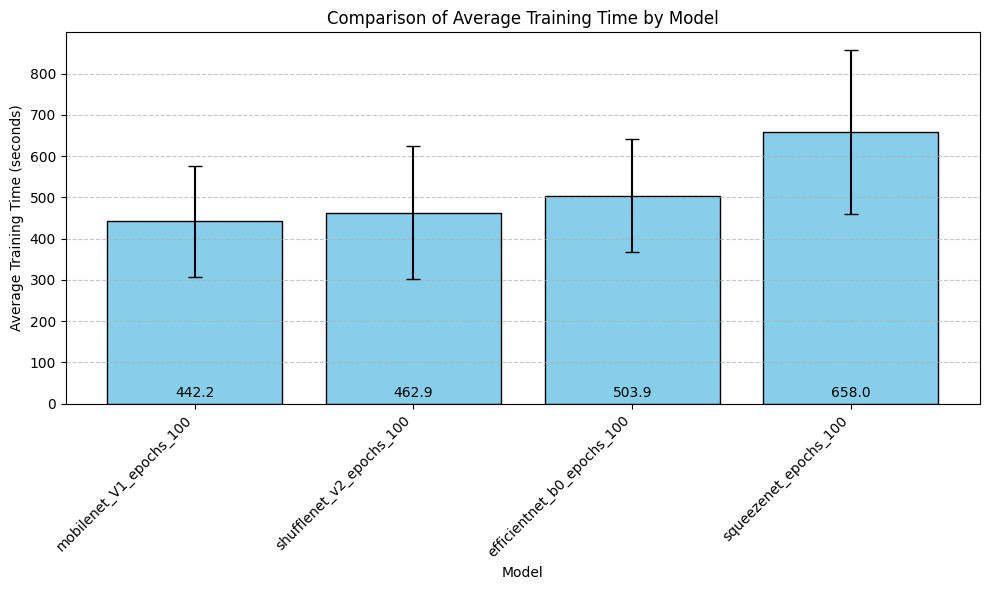

In [4]:
# Exemplo de uso
plot_training_time_comparison(csv_dir="logs_csv")

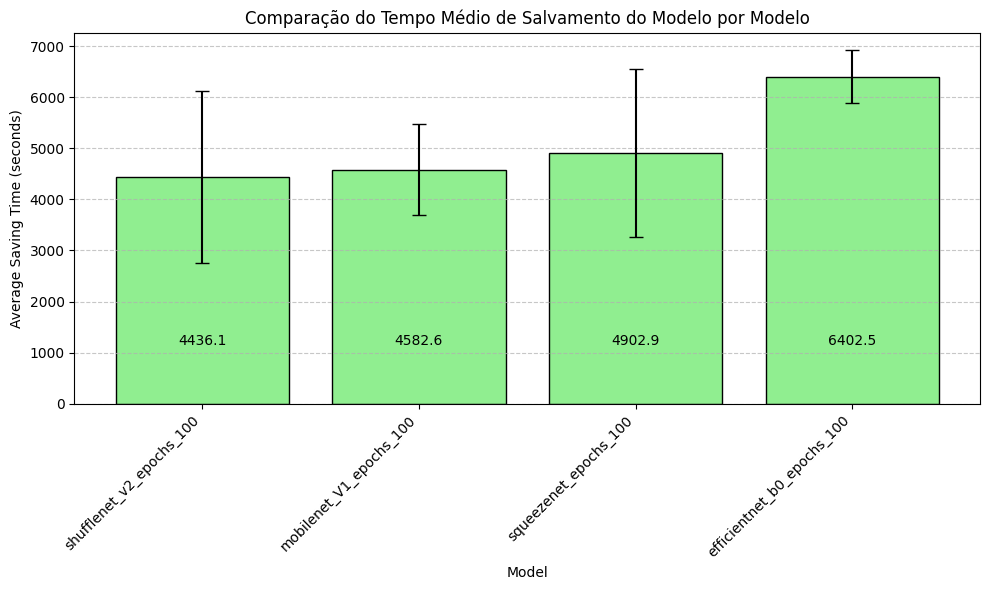

In [5]:
    plot_save_model_time_comparison(csv_dir="logs_csv")

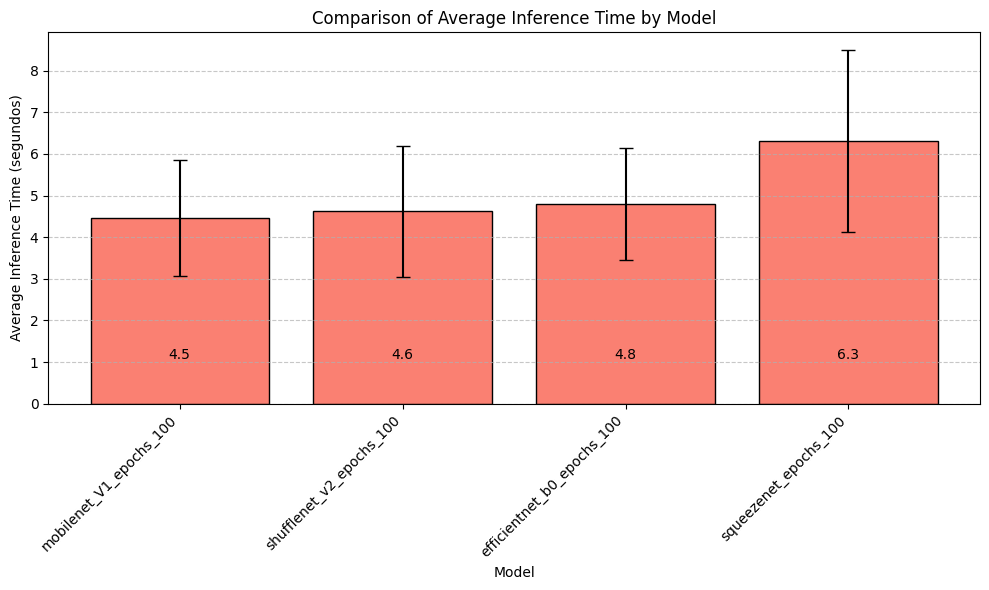

In [6]:
    plot_inference_time_comparison(csv_dir="logs_csv")



In [7]:
plot_temp_comparison(csv_dir="logs_csv")

C:\Users\Eduardo\AppData\Local\Temp\ipykernel_42656\1778627619.py:323: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [8]:
    plot_power_comparison(csv_dir="logs_csv")


C:\Users\Eduardo\AppData\Local\Temp\ipykernel_42656\1778627619.py:275: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


In [9]:
plot_gpu_utilization_comparison(csv_dir="logs_csv")

C:\Users\Eduardo\AppData\Local\Temp\ipykernel_42656\1778627619.py:417: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


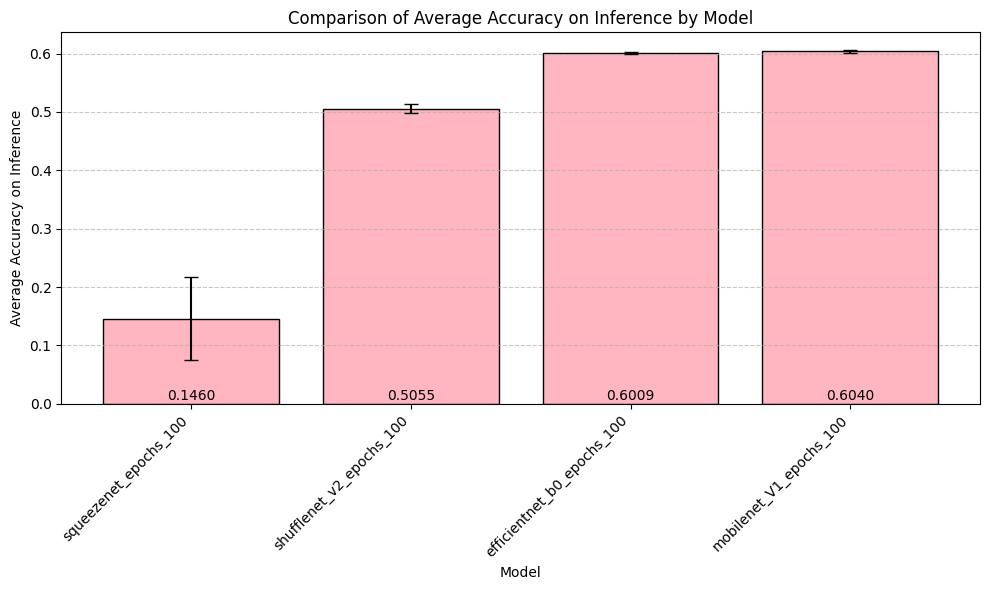

In [10]:
plot_inference_accuracy_comparison(csv_dir="logs_csv")

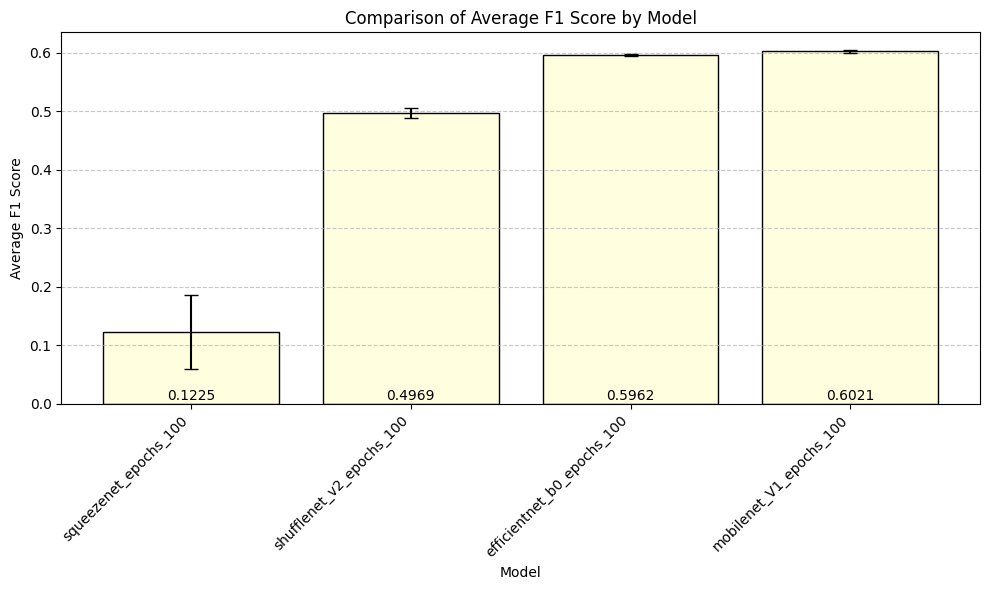

In [11]:
plot_inference_f1_score_comparison(csv_dir="logs_csv")

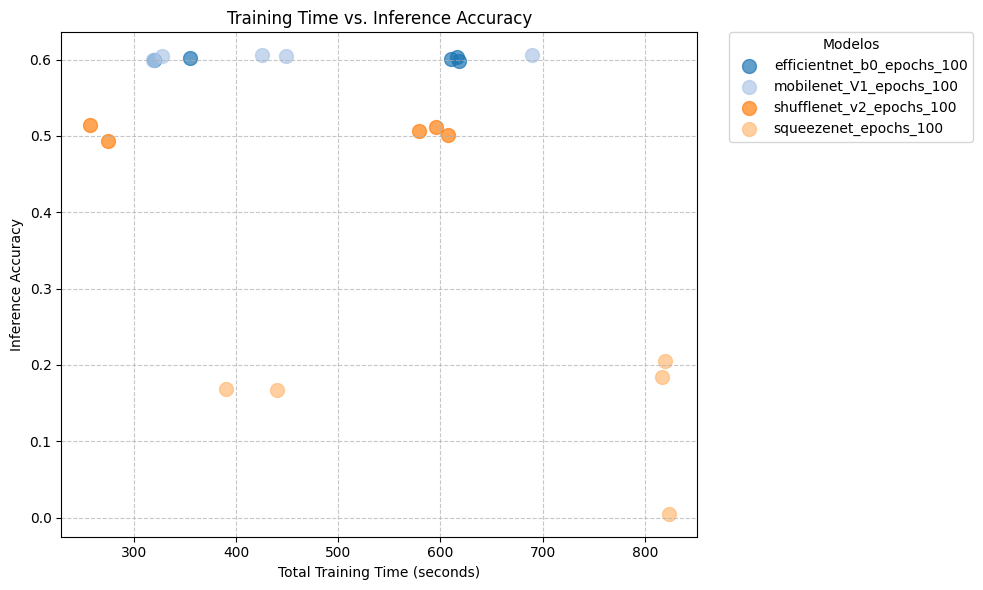

In [12]:
    plot_training_time_vs_inference_accuracy(csv_dir="logs_csv")

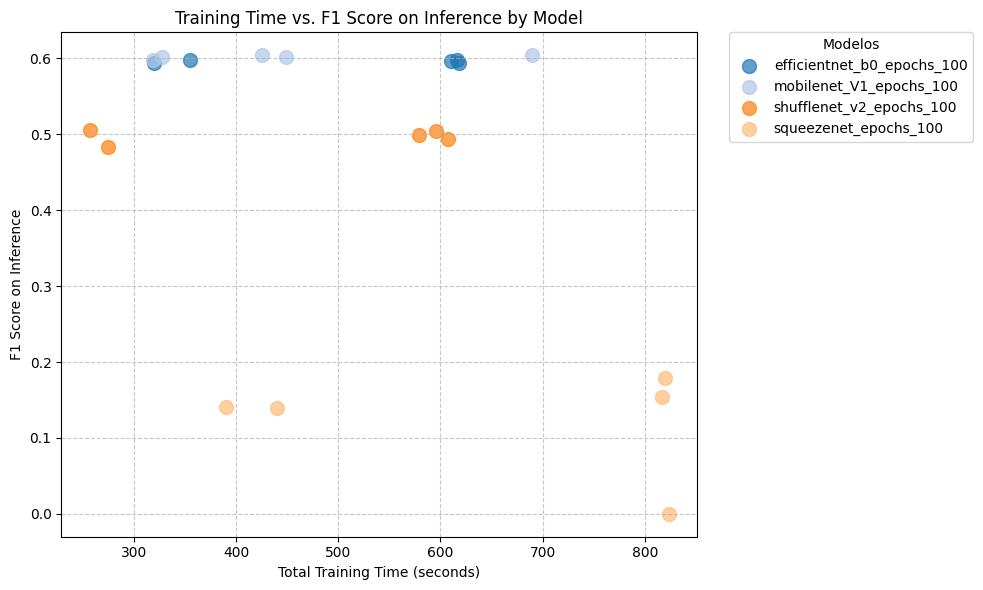

In [13]:
plot_training_time_vs_inference_f1_score(csv_dir="logs_csv")

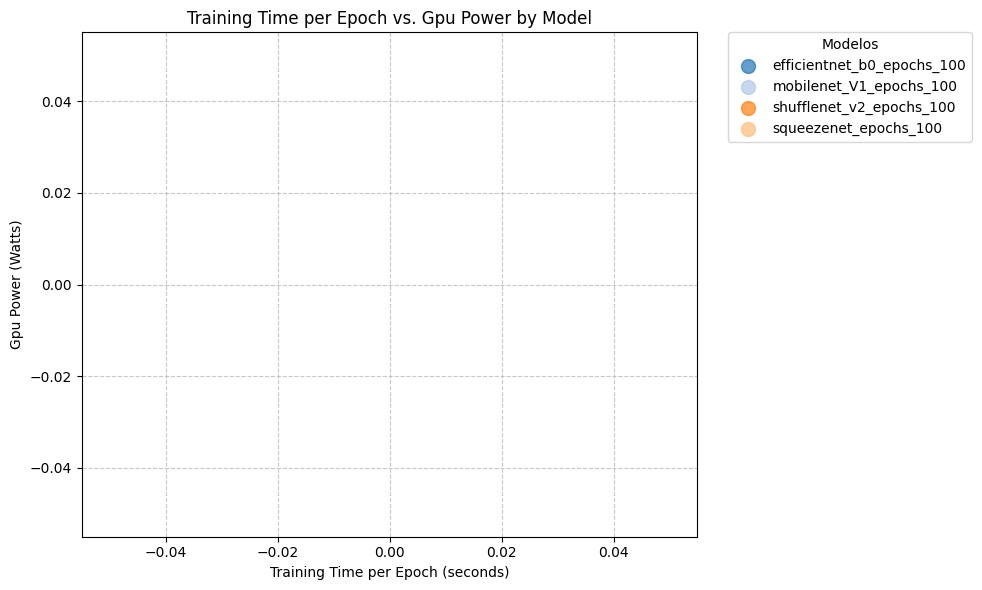

In [14]:
    plot_epoch_training_time_vs_gpu_power(csv_dir="logs_csv")


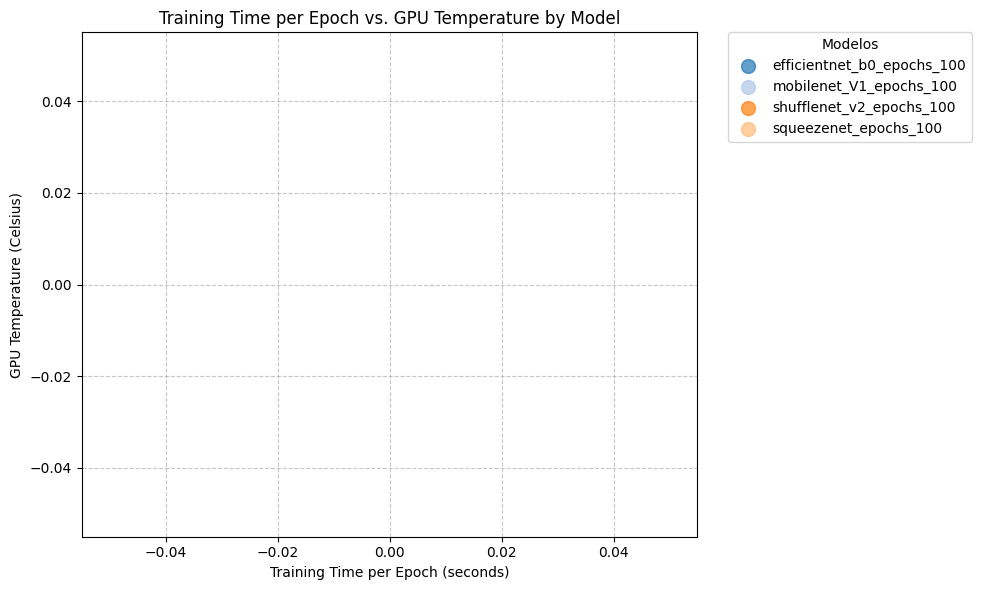

In [20]:
plot_epoch_training_time_vs_gpu_temp(csv_dir="logs_csv")



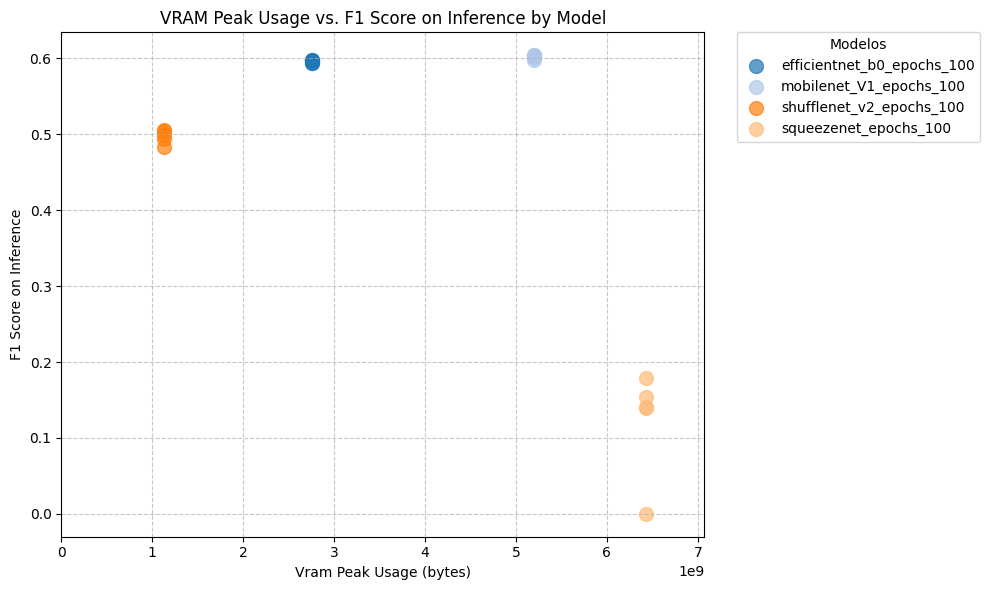

In [16]:
plot_max_vram_vs_inference_f1_score(csv_dir="logs_csv")

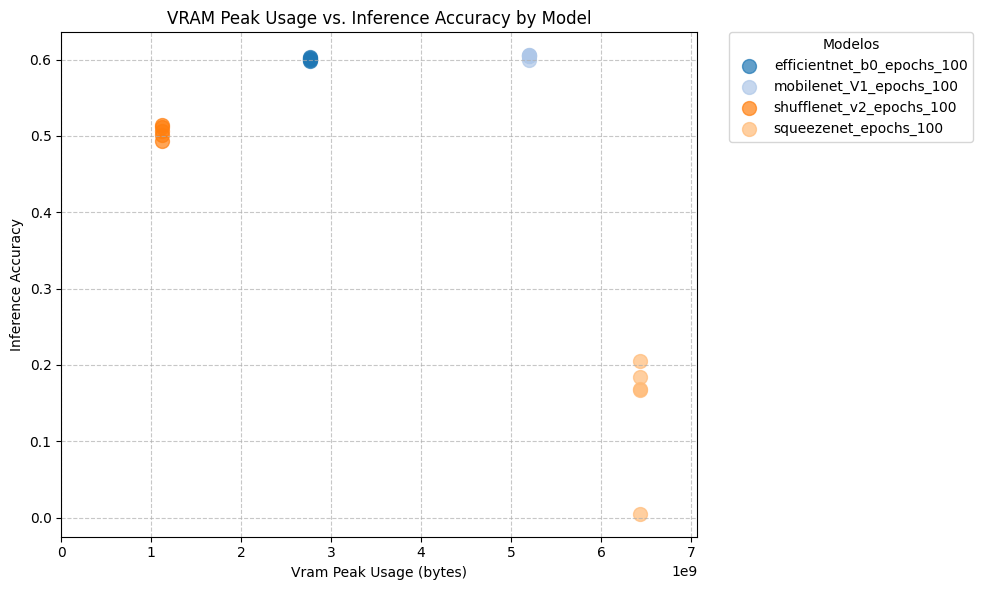

In [17]:
plot_max_vram_vs_inference_accuracy(csv_dir="logs_csv")

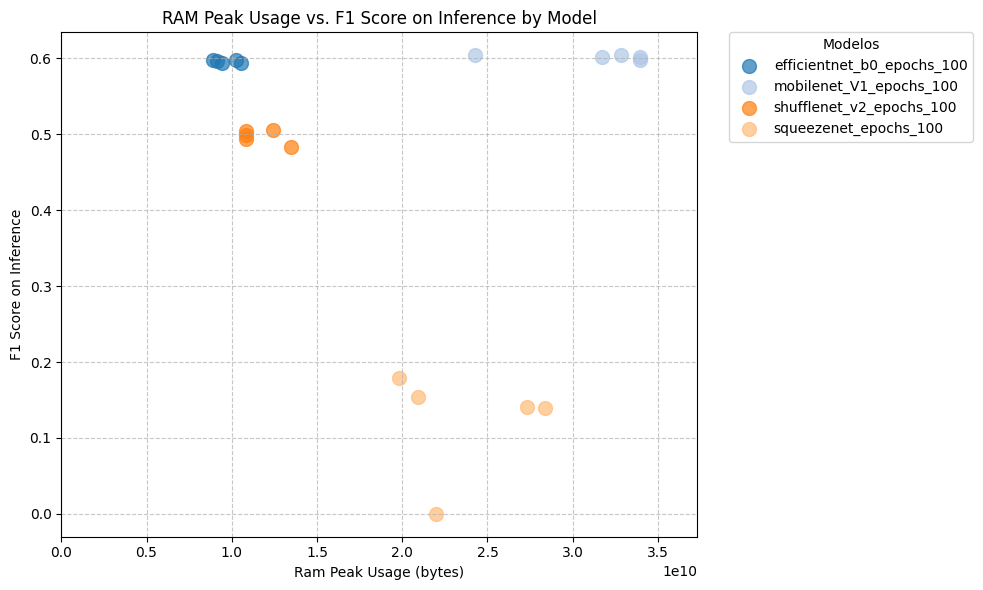

In [18]:
plot_max_ram_vs_inference_f1_score(csv_dir="logs_csv")

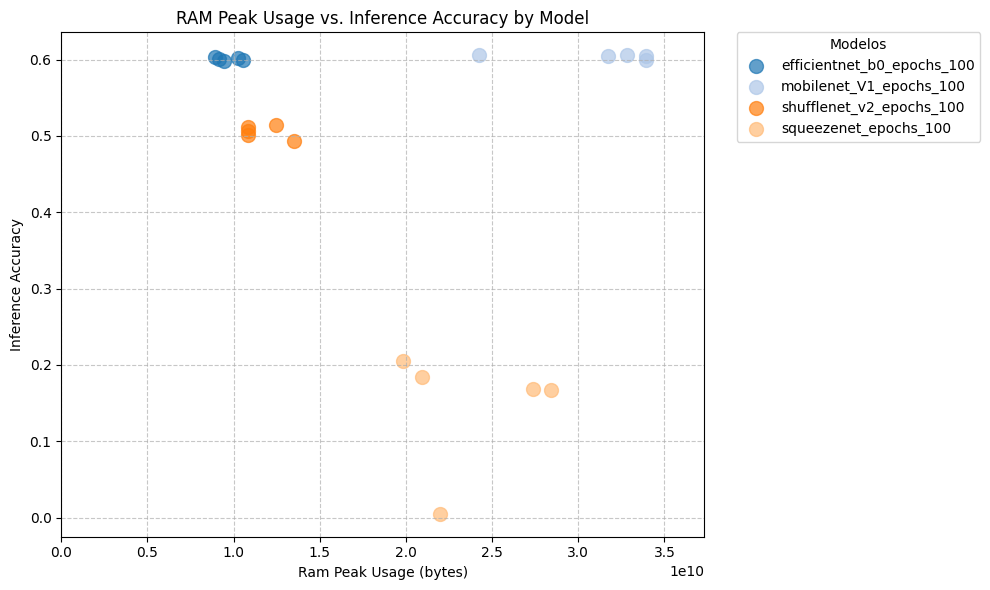

In [19]:
plot_max_ram_vs_inference_accuracy(csv_dir="logs_csv")